# Capítulo 3 — Realce en el Dominio Espacial

**Curso:** CC53 — Procesamiento de Imágenes  
**Profesor:** Javo  
**Duración:** ~2 horas en clase + repaso en casa  
**Bibliografía:** González & Woods, *Digital Image Processing* (3ra ed.), Cap. 3

---

## ¿Qué vamos a aprender hoy?

1. Qué significa **"trabajar en el dominio espacial"** (manipular píxeles directamente).
2. Tres familias de operaciones: **punto**, **vecindad** y **región**.
3. **Transformaciones de intensidad**: negativo, log, gamma, por tramos, umbralización.
4. **Histogramas**: leerlos, ecualizarlos, especificarlos.
5. **Filtros espaciales**: suavizado (media, gauss, mediana) y afilado (Sobel, Laplaciano, unsharp).
6. **Detalles prácticos**: padding, tamaño de ventana, métricas de evaluación.

> 💡 **Idea central:** Una imagen no es magia, es una matriz de números. Cualquier transformación visual que se les ocurra (más brillo, más contraste, bordes resaltados, ruido limpio…) se reduce a aplicarle una función matemática a esos números.

## 0. Configuración del entorno

Cargamos las librerías y definimos un par de funciones de ayuda. **Importante:** este notebook está diseñado para funcionar incluso sin internet — las imágenes que usamos se generan sintéticamente o se construyen a partir de scikit-image (`data.camera()`, `data.coins()`, etc., que vienen preinstaladas).

Imagen camera: shape=(512, 512), dtype=uint8, min=0, max=255


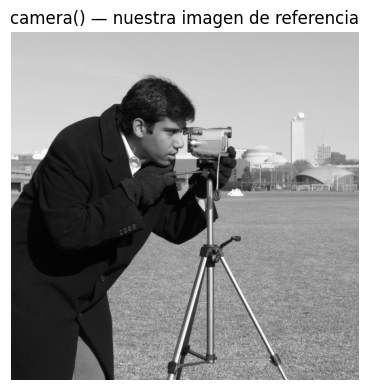

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, exposure, filters, util, color
from scipy import ndimage as ndi

plt.rcParams['figure.figsize'] = (10, 4)
plt.rcParams['image.cmap'] = 'gray'

def mostrar(imgs, titulos, cmap='gray', figsize=None):
    """Helper para mostrar varias imágenes lado a lado."""
    n = len(imgs)
    fig, axes = plt.subplots(1, n, figsize=figsize or (4*n, 4))
    if n == 1:
        axes = [axes]
    for ax, img, t in zip(axes, imgs, titulos):
        ax.imshow(img, cmap=cmap, vmin=0, vmax=255 if img.dtype==np.uint8 else None)
        ax.set_title(t)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def histograma(img, titulo='Histograma'):
    """Dibuja imagen y su histograma lado a lado."""
    fig, ax = plt.subplots(1, 2, figsize=(10, 3.5))
    ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
    ax[0].set_title('Imagen'); ax[0].axis('off')
    ax[1].hist(img.ravel(), bins=256, range=(0, 256), color='#4a90e2')
    ax[1].set_title(titulo); ax[1].set_xlabel('Intensidad'); ax[1].set_ylabel('Frecuencia')
    plt.tight_layout(); plt.show()

# Imagen base que usaremos en muchos ejemplos
camera = data.camera()  # Foto clásica del cameraman, 512x512 en escala de grises
print(f'Imagen camera: shape={camera.shape}, dtype={camera.dtype}, '
      f'min={camera.min()}, max={camera.max()}')
mostrar([camera], ['camera() — nuestra imagen de referencia'])

---
## 🧱 BLOQUE 1 — Operaciones en el dominio espacial (Slides 1–4)

**¿Qué significa "dominio espacial"?** Trabajar directamente sobre los valores de los píxeles `f(x, y)`. Sin transformadas (eso será el Capítulo 4), sin descomposiciones raras: solo aritmética sobre la matriz.

Las operaciones se clasifican según **cuánta información necesitan para procesar un píxel**:

| Tipo | ¿Qué mira? | Ejemplo |
|---|---|---|
| **Punto** | Solo el píxel actual | Invertir colores: `s = 255 - r` |
| **Vecindad** | El píxel y sus vecinos en una ventana | Promedio 3×3 (suavizar) |
| **Región** | Áreas completas con propiedades comunes | Segmentar células en microscopio |

Hoy nos enfocamos en **punto** y **vecindad**. Las operaciones de región son material del Cap. 10 (segmentación).

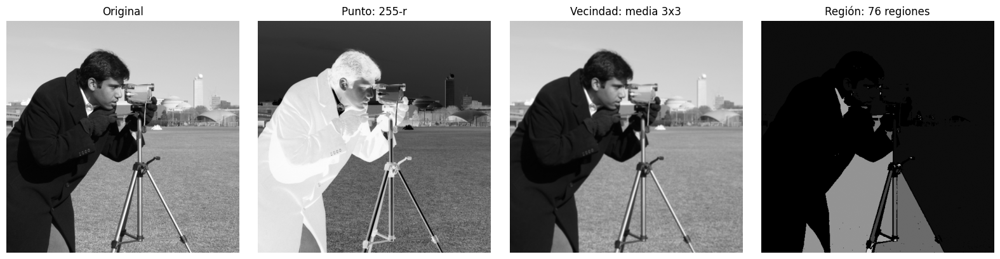

In [2]:
# Demostración rápida de los tres tipos de operación
img = camera.copy()

# 1) Operación de PUNTO: invertir cada píxel independientemente
img_punto = 255 - img

# 2) Operación de VECINDAD: promedio 3x3 (suaviza usando vecinos)
# ... la imagen resultante es un poco más borrosa porque cada píxel se reemplaza por el promedio de su vecindad 3x3
kernel_3x3 = np.ones((3,3))/9
img_vecindad = ndi.convolve(img.astype(float), kernel_3x3).astype(np.uint8)

# 3) Operación de REGIÓN: umbralización + etiquetado de regiones conectadas
binaria = (img > 100).astype(np.uint8)
etiquetas, n_regiones = ndi.label(binaria)
img_region = (etiquetas % 20) * 12  # colorear regiones para visualizar

mostrar(
    [img, img_punto, img_vecindad, img_region],
    ['Original', 'Punto: 255-r', 'Vecindad: media 3x3', f'Región: {n_regiones} regiones']
)

---
## 🔢 BLOQUE 2 — Transformaciones de intensidad (Slides 5–11)

Una **transformación de intensidad** es una función `s = T(r)` que recibe la intensidad de entrada `r` y devuelve la nueva intensidad `s`. **Mismo `r` → mismo `s`** sin importar la posición. Por eso son operaciones de punto.

Veámoslas una por una.

### 2.1 Lineal: `s = a·r + b` (brillo y contraste)

- **`a` controla el contraste** — multiplicar estira o comprime el rango.
- **`b` controla el brillo** — sumar desplaza todo arriba o abajo.

⚠️ Cuidado con los **valores fuera de rango**: si `a·r + b > 255`, hay que **saturar** (clip) a [0, 255].

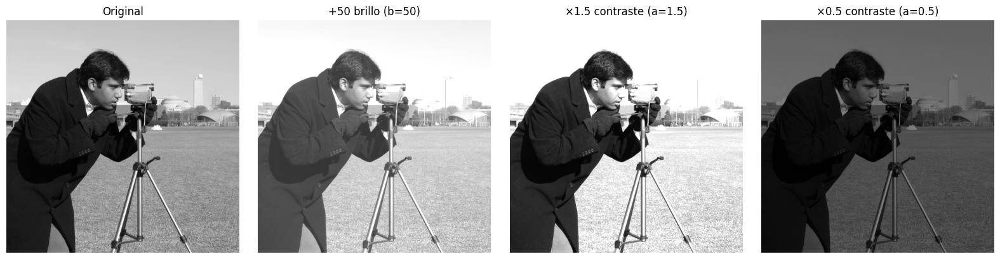

In [3]:
def lineal(img, a=1.0, b=0):
    out = a * img.astype(float) + b
    return np.clip(out, 0, 255).astype(np.uint8)

mostrar(
    [camera, lineal(camera, a=1.0, b=50), lineal(camera, a=1.5, b=0), lineal(camera, a=0.5, b=0)],
    ['Original', '+50 brillo (b=50)', '×1.5 contraste (a=1.5)', '×0.5 contraste (a=0.5)']
)

### 2.2 Negativo: `s = L − 1 − r`

Para imágenes de 8 bits, `L = 256`, así que `s = 255 − r`. Útil cuando el detalle de interés está en zonas brillantes (clásico ejemplo: radiografías).

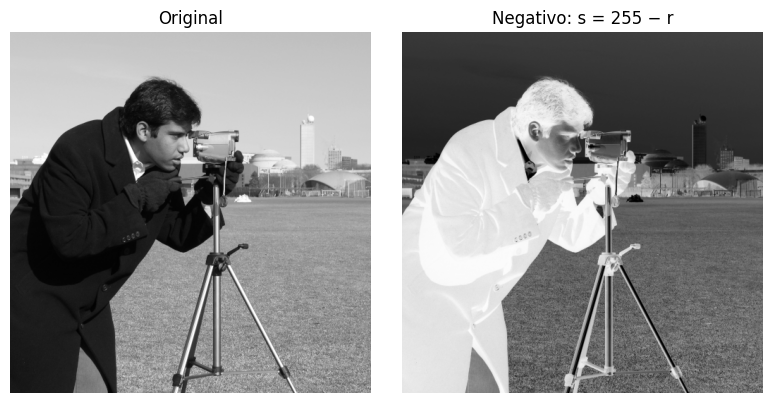

In [4]:
negativo = 255 - camera
mostrar([camera, negativo], ['Original', 'Negativo: s = 255 − r'])

### 2.3 Logarítmica: `s = c · log(1 + r)`

**Comprime** el rango alto y **expande** el rango bajo. Sirve cuando hay una enorme diferencia entre los valores más oscuros y más brillantes (imágenes astronómicas, espectros de Fourier).

El `+1` evita `log(0)`. La constante `c` se elige para que la salida llegue a 255: `c = 255 / log(1 + max(r))`.

Es útil para resaltar áreas con poca iluminación.

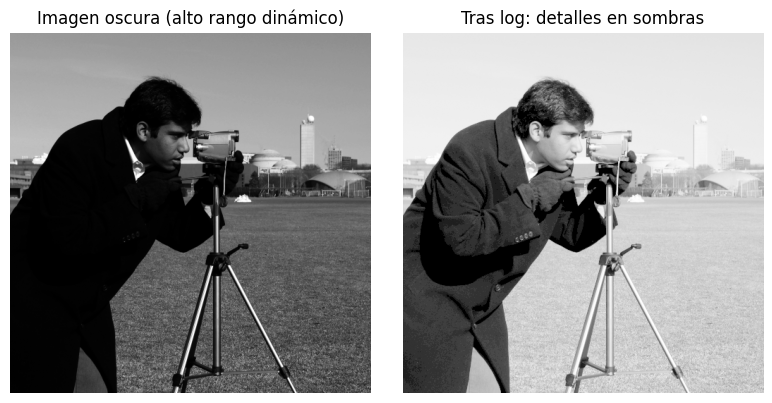

In [5]:
def transf_log(img):
    img_f = img.astype(float)
    c = 255 / np.log(1 + img_f.max())
    return np.clip(c * np.log(1 + img_f), 0, 255).astype(np.uint8)

# Construimos una imagen con alto rango dinámico para ver bien el efecto
rangoalto = (camera.astype(float) ** 2 / 255).astype(np.uint8)
mostrar(
    [rangoalto, transf_log(rangoalto)],
    ['Imagen oscura (alto rango dinámico)', 'Tras log: detalles en sombras']
)

### 2.4 Potencia (Gamma): `s = c · r^γ`

El **clásico** del procesamiento de imágenes. Lo usan TODAS las pantallas que ven en su vida diaria.

- **γ < 1**: aclara la imagen (expande sombras).
- **γ = 1**: identidad (no hace nada).
- **γ > 1**: oscurece la imagen (comprime sombras).

⚠️ Trabajamos en escala normalizada [0, 1] para que la potencia sea estable, y luego volvemos a [0, 255].

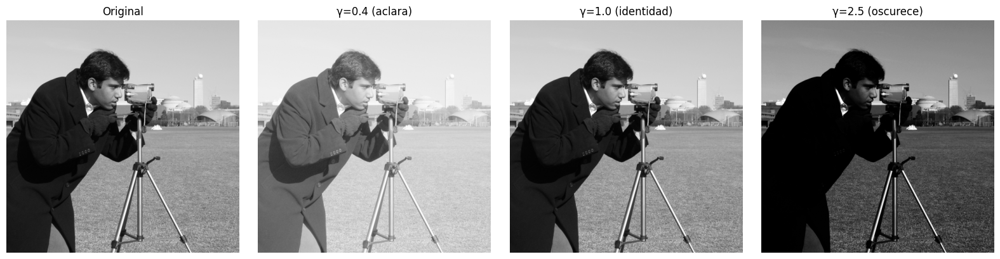

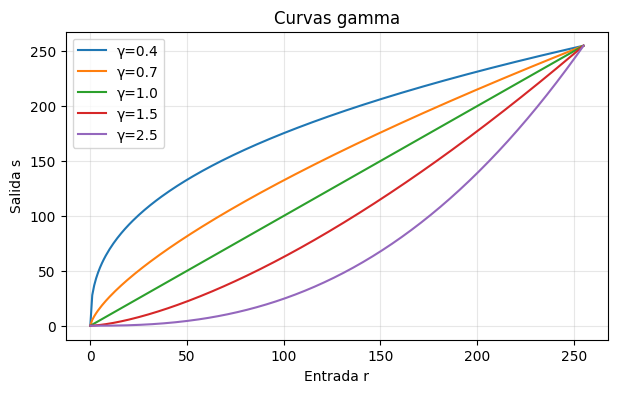

In [6]:
def gamma(img, g=1.0):
    norm = img.astype(float) / 255
    return np.clip((norm ** g) * 255, 0, 255).astype(np.uint8)

mostrar(
    [camera, gamma(camera, 0.4), gamma(camera, 1.0), gamma(camera, 2.5)],
    ['Original', 'γ=0.4 (aclara)', 'γ=1.0 (identidad)', 'γ=2.5 (oscurece)']
)

# Visualicemos las curvas de transformación
r = np.arange(256)
plt.figure(figsize=(7, 4))
for g in [0.4, 0.7, 1.0, 1.5, 2.5]:
    s = ((r/255)**g) * 255
    plt.plot(r, s, label=f'γ={g}')
plt.xlabel('Entrada r'); plt.ylabel('Salida s')
plt.title('Curvas gamma'); plt.legend(); plt.grid(alpha=0.3); plt.show()

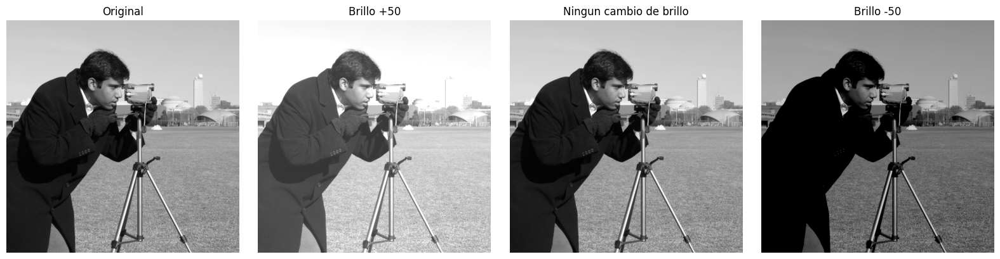

In [7]:
# Diferencias con brillo
mostrar(
    [camera, lineal(camera, a=1.0, b=50), camera, lineal(camera, a=1.0, b=-50)],
    ['Original', 'Brillo +50', 'Ningun cambio de brillo', 'Brillo -50']
)

### 2.5 Por tramos (piecewise linear stretching)

A veces queremos **estirar el contraste solo en un rango específico** y dejar el resto. Por ejemplo, en una radiografía mal expuesta donde los valores útiles están entre 80 y 180.

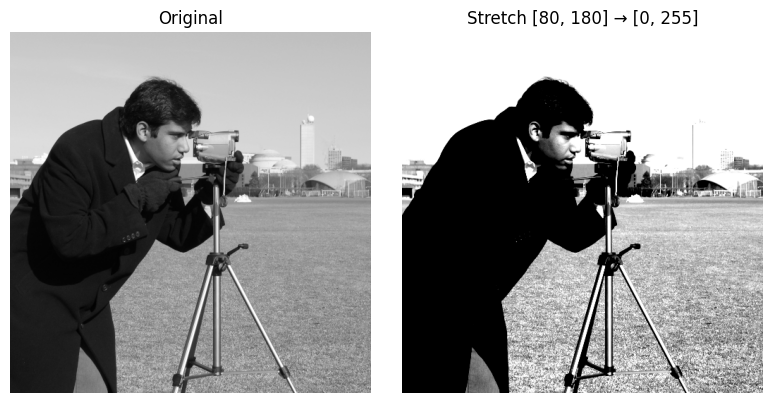

In [8]:
def stretch_tramos(img, r1=80, r2=180):
    """Estira linealmente el rango [r1, r2] a [0, 255] y satura los extremos."""
    out = (img.astype(float) - r1) * (255 / (r2 - r1))
    return np.clip(out, 0, 255).astype(np.uint8)

mostrar([camera, stretch_tramos(camera, 80, 180)],
        ['Original', 'Stretch [80, 180] → [0, 255]'])

### 2.6 Umbralización simple y adaptativa

Convertir la imagen en **binaria** (negro/blanco) usando un umbral `T`:

$$s = \begin{cases} 255 & \text{si } r > T \\ 0 & \text{si } r \leq T \end{cases}$$

- **Simple (global):** un solo `T` para toda la imagen. Falla si la iluminación no es uniforme.
- **Adaptativa (local):** `T` se calcula en cada ventana. Funciona con sombras y gradientes.

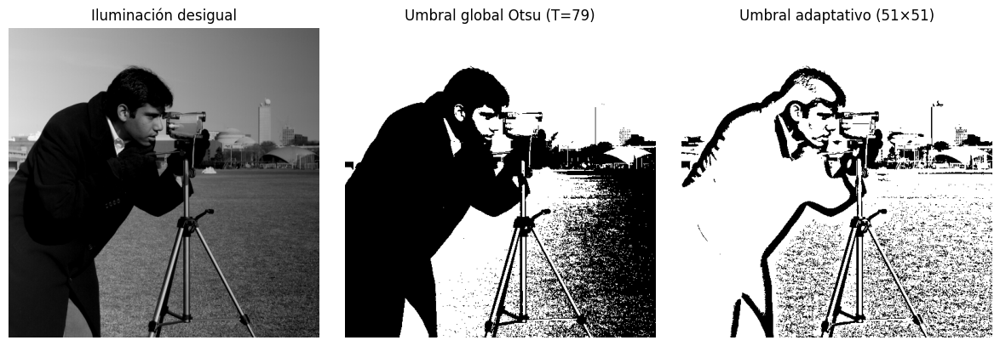

In [9]:
from skimage.filters import threshold_otsu, threshold_local

# Imagen con iluminación desigual (sombra falsa)
h, w = camera.shape
gradiente = np.tile(np.linspace(0, 100, w), (h, 1))
doc_iluminacion_mala = np.clip(camera.astype(float) - gradiente, 0, 255).astype(np.uint8)

T_global = threshold_otsu(doc_iluminacion_mala)
bin_global = (doc_iluminacion_mala > T_global).astype(np.uint8) * 255

T_local = threshold_local(doc_iluminacion_mala, block_size=51, offset=10)
bin_local = (doc_iluminacion_mala > T_local).astype(np.uint8) * 255

mostrar(
    [doc_iluminacion_mala, bin_global, bin_local],
    ['Iluminación desigual', f'Umbral global Otsu (T={T_global})', 'Umbral adaptativo (51×51)']
)

**Observen:** el umbral global pierde toda la zona de sombra. El adaptativo se acomoda región por región. Esta es la diferencia entre escanear bien un documento o que aparezca una mancha negra.

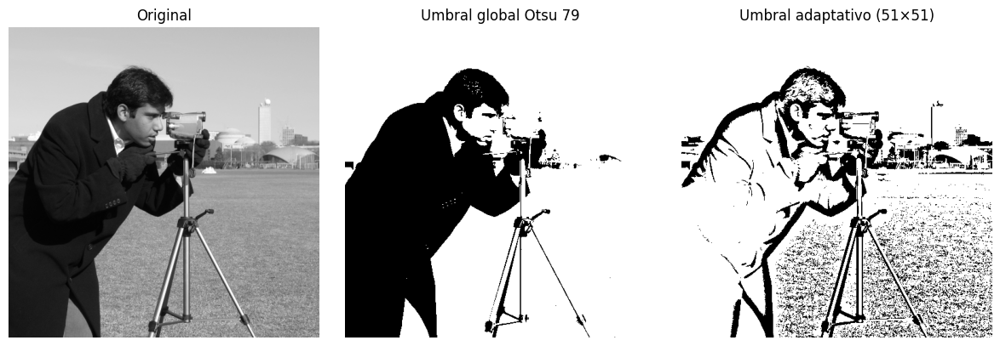

In [16]:
# Imagen original, pasarle otsu y adaptativo

T_global = 79
bin_global = (camera > T_global).astype(np.uint8) * 255

T_local = threshold_local(camera, block_size=51, offset=10)
bin_local = (camera > T_local).astype(np.uint8) * 255

mostrar(
    [camera, bin_global, bin_local],
    ['Original', f'Umbral global Otsu {T_global}', 'Umbral adaptativo (51×51)']
)

---
## 📊 BLOQUE 3 — Histogramas (Slides 12–14)

El **histograma** es simplemente: *¿cuántos píxeles tiene cada nivel de intensidad?* Es como pesar cuántos píxeles caen en cada "casillero" del 0 al 255.

Lo poderoso del histograma es que su **forma** nos cuenta cosas inmediatas:
- Sesgado a la izquierda → imagen oscura (subexpuesta).
- Sesgado a la derecha → imagen quemada (sobreexpuesta).
- Concentrado en el centro → bajo contraste.
- Distribuido uniformemente → buen aprovechamiento del rango.

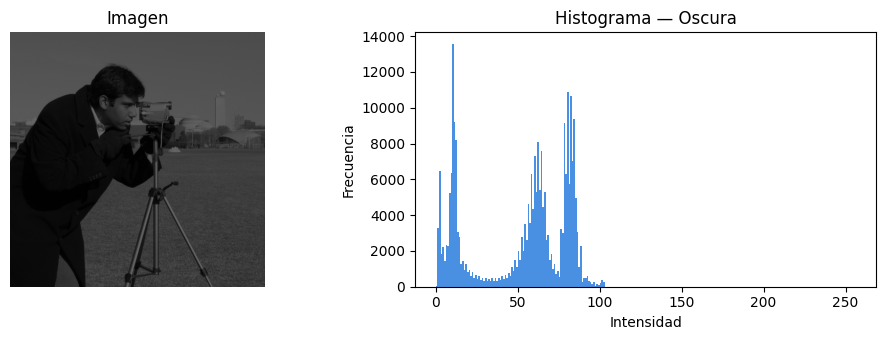

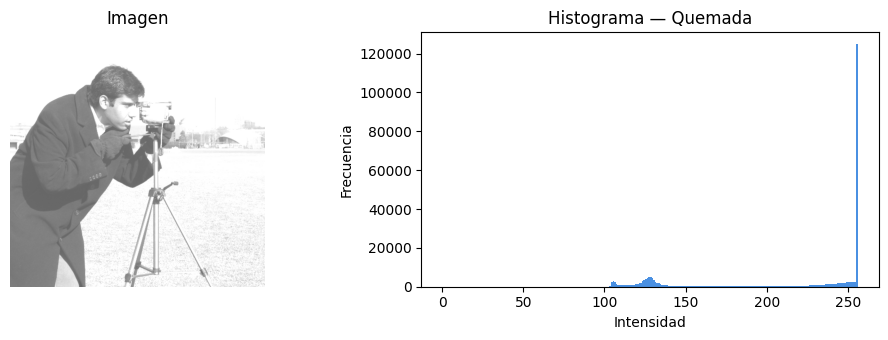

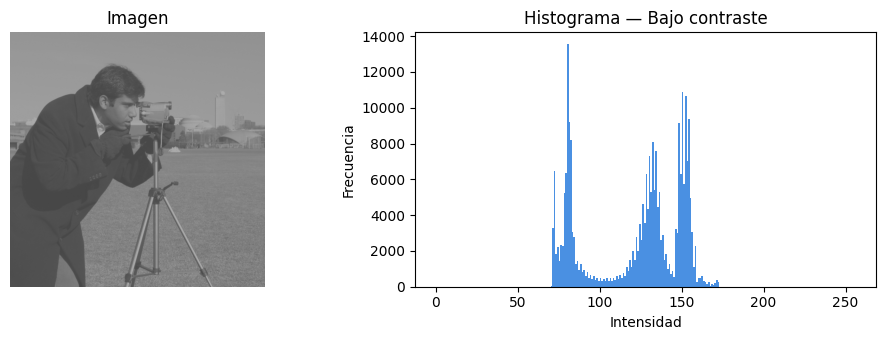

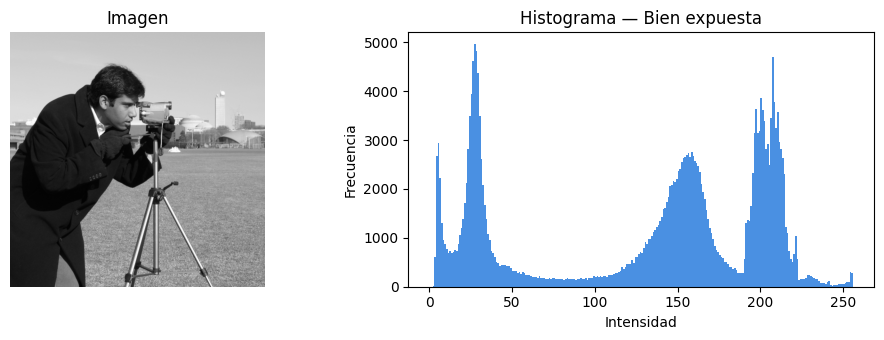

In [17]:
# Crear cuatro versiones del cameraman con distintos histogramas
oscura = (camera * 0.4).astype(np.uint8)
quemada = np.clip(camera.astype(float) + 100, 0, 255).astype(np.uint8)
bajo_cont = ((camera.astype(float) * 0.4) + 70).astype(np.uint8)

for img, nombre in [(oscura, 'Oscura'), (quemada, 'Quemada'),
                    (bajo_cont, 'Bajo contraste'), (camera, 'Bien expuesta')]:
    histograma(img, f'Histograma — {nombre}')

### 3.1 Ecualización de histograma

**Idea intuitiva:** queremos que todos los niveles de gris tengan aproximadamente la misma cantidad de píxeles → un histograma plano → contraste maximizado.

**¿Cómo se logra?** La transformación mágica es la **CDF** (función de distribución acumulada) normalizada:

$$s = T(r) = (L-1) \sum_{j=0}^{r} p_r(j)$$

Es decir: para cada píxel con intensidad `r`, su nueva intensidad es la **proporción acumulada** de píxeles con intensidad ≤ `r`, escalada a [0, 255].

Vamos a implementarla a mano para que vean que no es magia.

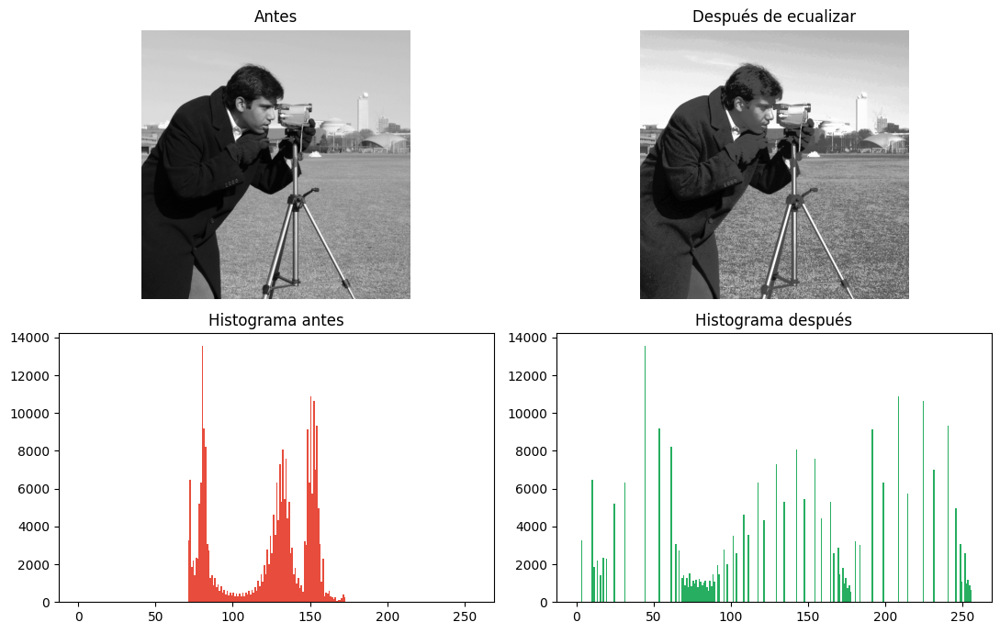

In [18]:
def ecualizar_manual(img):
    """Ecualización de histograma desde cero, sin librería."""
    # 1) Histograma
    hist, _ = np.histogram(img.ravel(), bins=256, range=(0, 256))
    # 2) PDF (probabilidad de cada nivel)
    pdf = hist / img.size
    # 3) CDF (acumulada)
    cdf = pdf.cumsum()
    # 4) LUT: nueva intensidad = CDF * 255
    lut = np.round(cdf * 255).astype(np.uint8)
    # 5) Aplicar LUT a cada píxel
    return lut[img]

ecu = ecualizar_manual(bajo_cont)

fig, ax = plt.subplots(2, 2, figsize=(11, 7))
ax[0,0].imshow(bajo_cont); ax[0,0].set_title('Antes'); ax[0,0].axis('off')
ax[0,1].imshow(ecu); ax[0,1].set_title('Después de ecualizar'); ax[0,1].axis('off')
ax[1,0].hist(bajo_cont.ravel(), bins=256, range=(0,256), color='#e74c3c')
ax[1,0].set_title('Histograma antes')
ax[1,1].hist(ecu.ravel(), bins=256, range=(0,256), color='#27ae60')
ax[1,1].set_title('Histograma después')
plt.tight_layout(); plt.show()

### 3.2 Especificación de histograma (matching)

A veces no queremos un histograma plano, queremos uno **específico** (por ejemplo, el de una imagen de referencia con una iluminación que nos guste). A esto se le llama **histogram matching**.

La idea: ecualizar la imagen origen y luego "des-ecualizar" hacia el histograma destino.

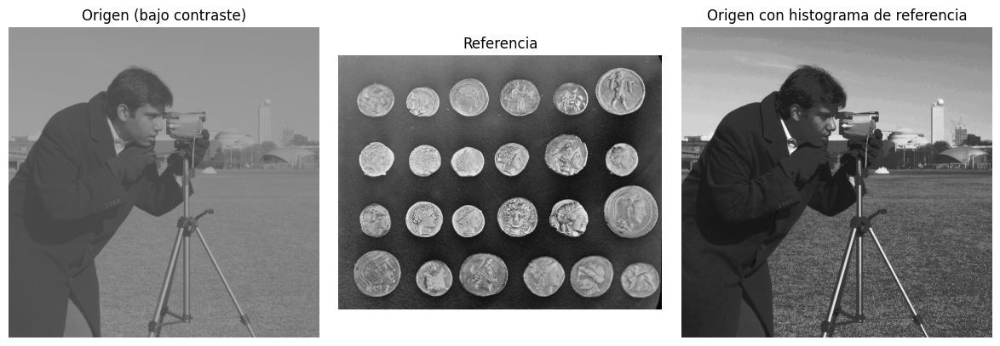

In [19]:
from skimage.exposure import match_histograms

# Imagen de referencia (más "contrastada")
referencia = data.coins()
matched = match_histograms(bajo_cont, referencia)

mostrar(
    [bajo_cont, referencia, matched.astype(np.uint8)],
    ['Origen (bajo contraste)', 'Referencia', 'Origen con histograma de referencia']
)

### 3.3 CLAHE: ecualización adaptativa con límite de contraste

La ecualización global tiene un problema: a veces **sobre-amplifica el ruido** en regiones planas. **CLAHE** (*Contrast Limited Adaptive Histogram Equalization*) hace dos cosas:

1. Ecualiza por **regiones pequeñas** (no toda la imagen a la vez).
2. **Limita** la altura del histograma para no amplificar ruido sin control.

Es el go-to en imágenes médicas.

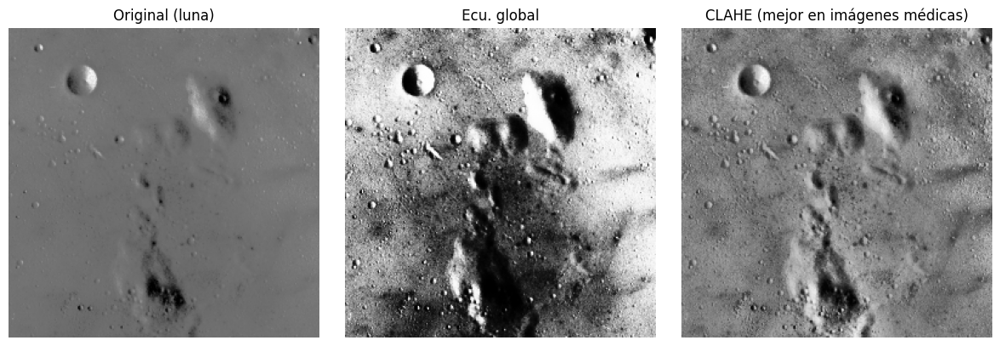

In [20]:
from skimage.exposure import equalize_hist, equalize_adapthist

# Imagen médica simulada con poco contraste
medica = data.moon()

ecu_global = (equalize_hist(medica) * 255).astype(np.uint8)
ecu_clahe  = (equalize_adapthist(medica, clip_limit=0.03) * 255).astype(np.uint8)

mostrar(
    [medica, ecu_global, ecu_clahe],
    ['Original (luna)', 'Ecu. global', 'CLAHE (mejor en imágenes médicas)']
)

---
## 🌫️ BLOQUE 4 — Filtros de suavizado (Slides 15–17, 25–27)

Pasamos a operaciones de **vecindad**. La operación clave es la **convolución**:

$$g(x,y) = \sum_{s=-a}^{a} \sum_{t=-b}^{b} w(s,t)\, f(x-s, y-t)$$

En palabras: cada píxel de salida es una **combinación ponderada** de sus vecinos. Los pesos los define una matriz pequeña llamada **kernel** o **máscara**.

*(Diferencia entre convolución y correlación: la convolución "voltea" el kernel antes de aplicarlo. Para kernels simétricos, ambas dan el mismo resultado y mucha gente las usa indistintamente.)*

### 4.1 Filtro de media (box filter)

El kernel más simple del mundo: **promedio uniforme**. Para 3×3:

$$\frac{1}{9}\begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$$

Suaviza, pero **destruye bordes** (los hace borrosos).

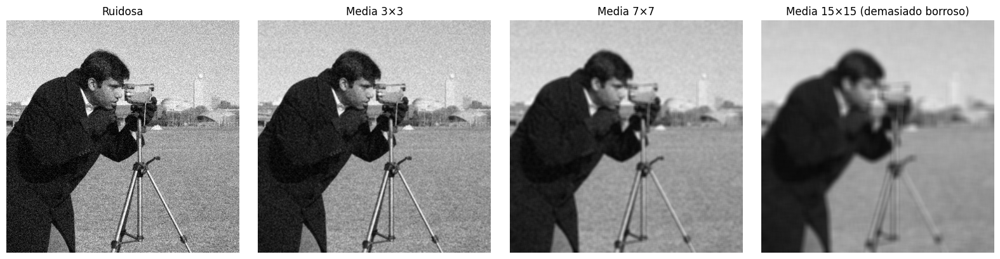

In [21]:
# Imagen con ruido gaussiano para ver el efecto del suavizado
ruidosa = util.random_noise(camera, mode='gaussian', var=0.01)
ruidosa = (ruidosa * 255).astype(np.uint8)

def media(img, k=3):
    kernel = np.ones((k, k)) / (k*k)
    return ndi.convolve(img.astype(float), kernel).astype(np.uint8)

mostrar(
    [ruidosa, media(ruidosa, 3), media(ruidosa, 7), media(ruidosa, 15)],
    ['Ruidosa', 'Media 3×3', 'Media 7×7', 'Media 15×15 (demasiado borroso)']
)

**Observación clave (Slide 26):** el tamaño de ventana es un **compromiso**. Más grande = menos ruido, pero más pérdida de detalle. No existe el tamaño "correcto" universal.

### 4.2 Filtro Gaussiano

Como la media, pero los pesos siguen una **gaussiana 2D**: el píxel central pesa más, los lejanos pesan menos. Resulta más natural que la media porque imita cómo se difumina la luz.

$$G(x,y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}}$$

El parámetro clave es `σ` (desviación estándar): controla cuánto suaviza.

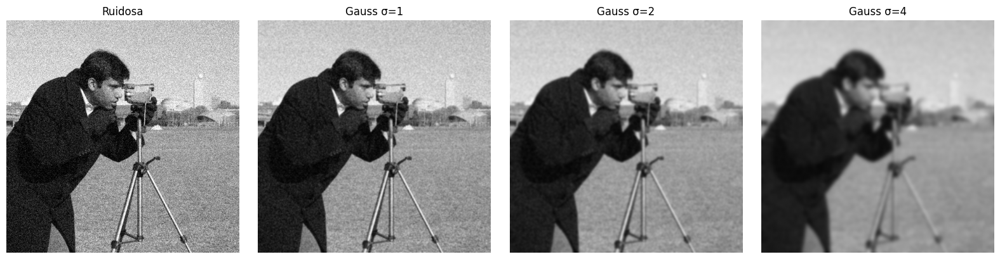

In [22]:
from skimage.filters import gaussian

g1 = (gaussian(ruidosa, sigma=1) * 255).astype(np.uint8)
g2 = (gaussian(ruidosa, sigma=2) * 255).astype(np.uint8)
g4 = (gaussian(ruidosa, sigma=4) * 255).astype(np.uint8)

mostrar([ruidosa, g1, g2, g4],
        ['Ruidosa', 'Gauss σ=1', 'Gauss σ=2', 'Gauss σ=4'])

### 4.3 Filtro de mediana (no lineal)

Aquí la cosa cambia: en lugar de **promediar**, tomamos la **mediana** de la vecindad. Esto es **brutal contra el ruido sal y pimienta** (puntos blancos y negros aislados) porque la mediana ignora los outliers.

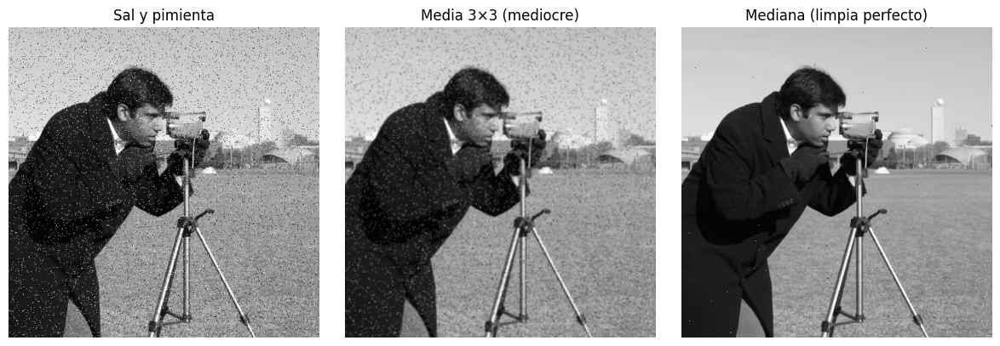

In [23]:
# Ruido sal y pimienta
sal_pim = util.random_noise(camera, mode='s&p', amount=0.05)
sal_pim = (sal_pim * 255).astype(np.uint8)

from skimage.filters import median
from skimage.morphology import disk

media_sp  = media(sal_pim, 3)
mediana_sp = median(sal_pim, disk(1))

mostrar(
    [sal_pim, media_sp, mediana_sp],
    ['Sal y pimienta', 'Media 3×3 (mediocre)', 'Mediana (limpia perfecto)']
)

**Lección:** elegir el filtro correcto **depende del tipo de ruido**. Gauss para ruido gaussiano, mediana para sal y pimienta. Esto será central en el Cap. 5.

### 4.4 Padding: ¿qué pasa en los bordes?

Cuando aplicamos un kernel cerca del borde, **faltan vecinos**. Hay que inventarlos. A esto se le llama **padding**.

Estrategias comunes:
- **`zero`**: rellena con ceros (genera bordes oscuros).
- **`reflect`**: refleja la imagen en el borde (más natural).
- **`replicate`** / **`edge`**: copia el último píxel del borde.
- **`wrap`**: el borde derecho se conecta con el izquierdo (raro, pero útil en texturas).

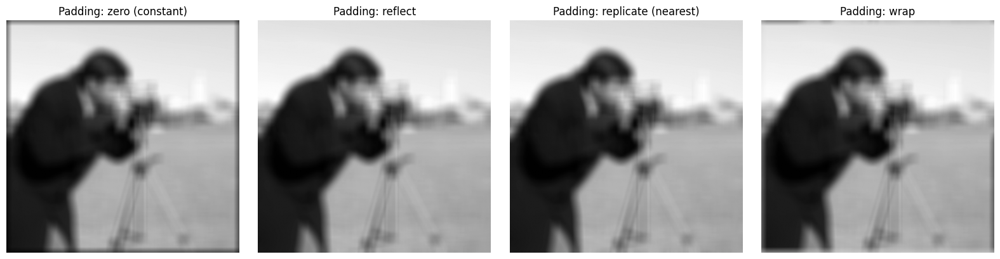

In [24]:
kernel = np.ones((25, 25)) / (25*25)  # Filtro grande para amplificar el efecto

modos = ['constant', 'reflect', 'nearest', 'wrap']
labels = ['zero (constant)', 'reflect', 'replicate (nearest)', 'wrap']
imgs = [ndi.convolve(camera.astype(float), kernel, mode=m).astype(np.uint8) for m in modos]

fig, ax = plt.subplots(1, 4, figsize=(16, 4))
for a, im, l in zip(ax, imgs, labels):
    a.imshow(im); a.set_title(f'Padding: {l}'); a.axis('off')
plt.tight_layout(); plt.show()

**Fíjense** en los bordes oscuros del primero (zero) vs. los demás. En aplicaciones reales, casi siempre se usa `reflect` o `replicate`.

---
## 🔪 BLOQUE 5 — Filtros de afilado (Slides 19–24)

Si **suavizar** integra (saca el promedio), **afilar** deriva (saca diferencias). Los bordes son donde la intensidad **cambia rápidamente** → derivada grande.

### 5.1 Operadores de gradiente: Sobel

El gradiente de una imagen es un vector con dos componentes:

$$\nabla f = \begin{bmatrix} G_x \\ G_y \end{bmatrix} = \begin{bmatrix} \partial f / \partial x \\ \partial f / \partial y \end{bmatrix}$$

Sobel aproxima estas derivadas con dos kernels 3×3:

$$S_x = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}, \quad S_y = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}$$

La **magnitud** del gradiente es lo que nos interesa: $|\nabla f| = \sqrt{G_x^2 + G_y^2}$

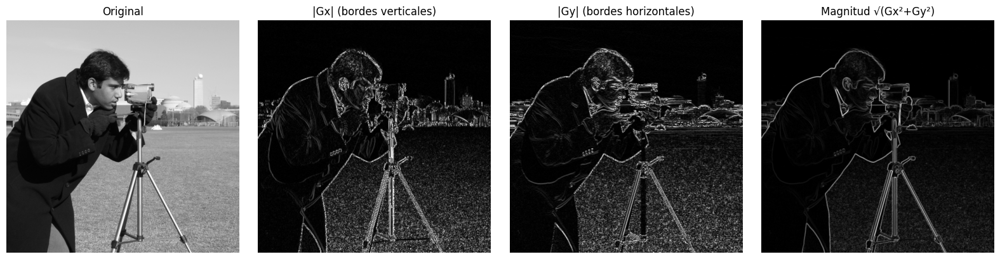

In [25]:
Sx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
Sy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

Gx = ndi.convolve(camera.astype(float), Sx)
Gy = ndi.convolve(camera.astype(float), Sy)
magnitud = np.sqrt(Gx**2 + Gy**2)
magnitud = np.clip(magnitud / magnitud.max() * 255, 0, 255).astype(np.uint8)

mostrar(
    [camera, np.abs(Gx).astype(np.uint8), np.abs(Gy).astype(np.uint8), magnitud],
    ['Original', '|Gx| (bordes verticales)', '|Gy| (bordes horizontales)', 'Magnitud √(Gx²+Gy²)']
)

### 5.2 Operador Laplaciano (segunda derivada)

El gradiente da **la pendiente**. El Laplaciano da **la curvatura**: detecta dónde la pendiente cambia.

$$\nabla^2 f = \frac{\partial^2 f}{\partial x^2} + \frac{\partial^2 f}{\partial y^2}$$

Aproximación discreta más común (con 4 vecinos):

$$L = \begin{bmatrix} 0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0 \end{bmatrix}$$

**Nota:** el Laplaciano **es muy sensible al ruido**. Por eso normalmente se combina con un suavizado gaussiano previo → **LoG**.

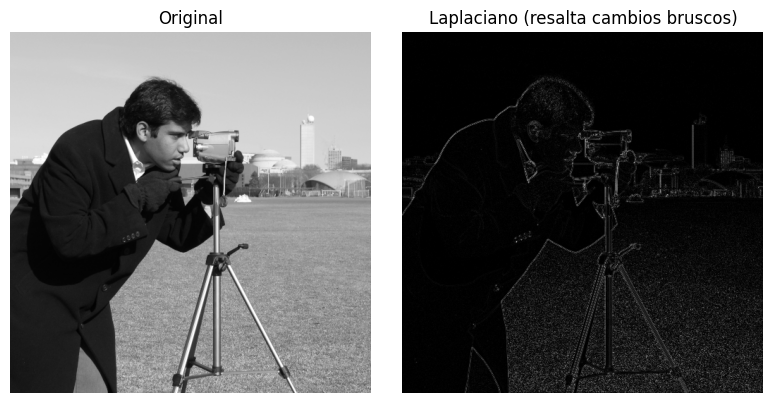

In [26]:
L = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
lap = ndi.convolve(camera.astype(float), L)

# Para visualizarlo, escalamos (puede tener valores negativos)
lap_vis = (np.abs(lap) / np.abs(lap).max() * 255).astype(np.uint8)

mostrar([camera, lap_vis], ['Original', 'Laplaciano (resalta cambios bruscos)'])

### 5.3 LoG y DoG

- **LoG (Laplacian of Gaussian)**: aplicar gaussiano + laplaciano. Más estable.
- **DoG (Difference of Gaussians)**: aproximación al LoG restando dos gaussianos con `σ` distintos. Es la base de **SIFT**.

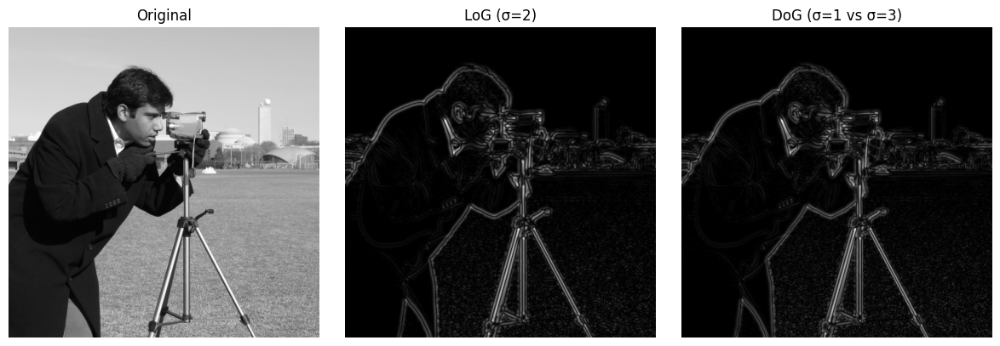

In [19]:
from scipy.ndimage import gaussian_laplace, gaussian_filter

log_img = gaussian_laplace(camera.astype(float), sigma=2)
log_vis = (np.abs(log_img) / np.abs(log_img).max() * 255).astype(np.uint8)

g_pequeno = gaussian_filter(camera.astype(float), sigma=1)
g_grande  = gaussian_filter(camera.astype(float), sigma=3)
dog = g_pequeno - g_grande
dog_vis = (np.abs(dog) / np.abs(dog).max() * 255).astype(np.uint8)

mostrar([camera, log_vis, dog_vis],
        ['Original', 'LoG (σ=2)', 'DoG (σ=1 vs σ=3)'])

### 5.4 Unsharp Masking y High-Boost (afilado clásico)

**Idea genial y vieja:** ¿quieren resaltar los detalles? **Resten una versión borrosa de la imagen.** Lo que queda son los detalles finos, que se vuelven a sumar a la original.

$$\hat{f} = f + k \cdot (f - f_{\text{suavizada}})$$

- `k = 1` → unsharp masking estándar.
- `k > 1` → high-boost (más afilado, más ruido).

Esto es lo que hace el botón "Sharpen" en Photoshop, Lightroom y prácticamente cualquier editor.

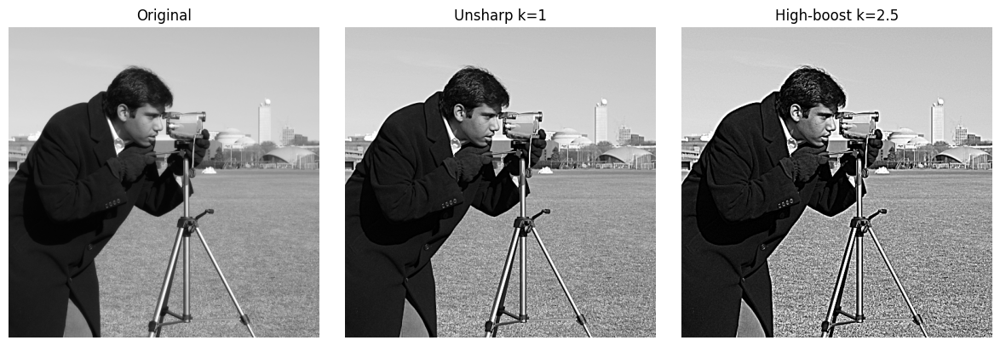

In [20]:
def unsharp(img, sigma=2, k=1.0):
    blur = gaussian_filter(img.astype(float), sigma=sigma)
    detalle = img.astype(float) - blur
    salida = img.astype(float) + k * detalle
    return np.clip(salida, 0, 255).astype(np.uint8)

mostrar(
    [camera, unsharp(camera, sigma=2, k=1.0), unsharp(camera, sigma=2, k=2.5)],
    ['Original', 'Unsharp k=1', 'High-boost k=2.5']
)

---
## 📏 BLOQUE 6 — Métricas de evaluación (Slide 29)

**¿Cómo sabemos si un realce mejoró la imagen?** Hay dos enfoques:

1. **Subjetivo:** que un humano la vea y juzgue. Sigue siendo el gold standard.
2. **Objetivo:** métricas matemáticas. Las dos más usadas:

**PSNR (Peak Signal-to-Noise Ratio):**
$$\text{PSNR} = 10 \log_{10}\left(\frac{255^2}{\text{MSE}}\right)$$
Más alto = más parecido. Por encima de 30 dB se considera buena calidad.

**SSIM (Structural Similarity Index):**
Va de 0 a 1. Mide similitud **estructural** (luminancia, contraste, estructura). Es más cercano a la percepción humana que el PSNR.

In [21]:
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity as ssim_fn

ruidosa_eval = util.random_noise(camera, mode='gaussian', var=0.02)
ruidosa_eval = (ruidosa_eval * 255).astype(np.uint8)

denoise_media   = media(ruidosa_eval, 3)
denoise_gauss   = (gaussian(ruidosa_eval, sigma=1.5) * 255).astype(np.uint8)
denoise_mediana = median(ruidosa_eval, disk(1))

print(f"{'Método':<20} {'PSNR (dB)':>12} {'SSIM':>10}")
print('-' * 44)
for nombre, img_filtrada in [
    ('Sin filtrar', ruidosa_eval),
    ('Media 3×3',   denoise_media),
    ('Gauss σ=1.5', denoise_gauss),
    ('Mediana 3×3', denoise_mediana),
]:
    p = psnr_fn(camera, img_filtrada)
    s = ssim_fn(camera, img_filtrada)
    print(f'{nombre:<20} {p:>12.2f} {s:>10.4f}')

Método                  PSNR (dB)       SSIM
--------------------------------------------
Sin filtrar                 17.69     0.2098
Media 3×3                   24.88     0.4667


Gauss σ=1.5                 25.61     0.6232
Mediana 3×3                 22.12     0.3191


**Conclusión del bloque:** las métricas son herramientas, no sentencias. Una imagen puede tener mejor PSNR y verse peor (ej: filtrar agresivo borra detalle). Siempre evalúen también con sus ojos.

---
## 🧪 EJERCICIOS DE CIERRE — Para hacer en clase si queda tiempo

Resuelvan en grupos de 2 personas:

**Ejercicio 1 — Detective de transformación.** Les pasamos una imagen procesada y la original. Identifiquen qué transformación se aplicó (gamma, log, lineal, etc.) y estimen los parámetros.

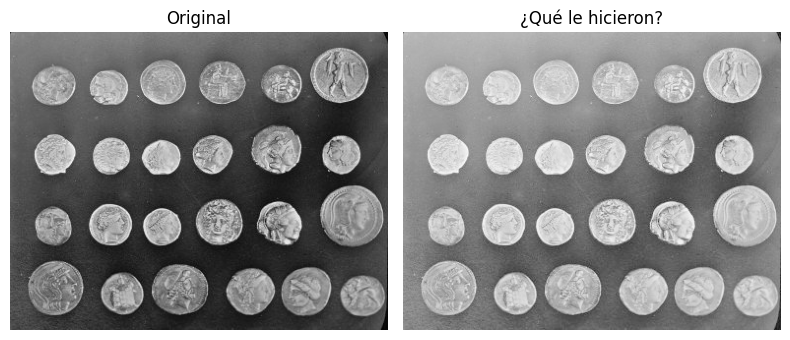

In [22]:
# Imagen original
original = data.coins()

# Imagen procesada (no les decimos cómo). Pista: γ está entre 0.2 y 3.0.
np.random.seed(42)
gamma_secreto = 0.5
procesada = gamma(original, gamma_secreto)

mostrar([original, procesada], ['Original', '¿Qué le hicieron?'])

# TODO: Implementen una búsqueda para hallar el γ que mejor reproduce 'procesada'.
# Pista: prueben varios γ y minimicen el MSE entre gamma(original, γ) y procesada.

**Ejercicio 2 — Pipeline de mejora.** Aquí tienen una imagen mal escaneada. Diseñen un pipeline de al menos 3 pasos para mejorarla y reporten PSNR/SSIM contra una versión limpia.

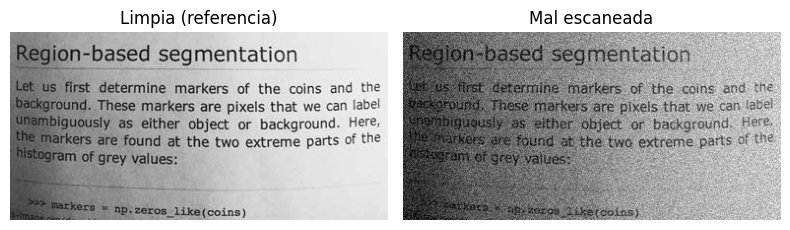

In [23]:
limpia = data.page()
# Simulamos un escaneo malo: contraste reducido + ruido + sombra
h, w = limpia.shape
sombra = np.tile(np.linspace(0, 60, w), (h, 1))
mal_escaneada = np.clip(limpia.astype(float)*0.6 + sombra, 0, 255).astype(np.uint8)
mal_escaneada = util.random_noise(mal_escaneada, mode='gaussian', var=0.005)
mal_escaneada = (mal_escaneada * 255).astype(np.uint8)

mostrar([limpia, mal_escaneada], ['Limpia (referencia)', 'Mal escaneada'])

# TODO: pipeline de al menos 3 pasos y comparen métricas
# Sugerencia: suavizar → corregir sombra (¿stretch?, ¿CLAHE?) → afilar

---
## 📋 Cheat sheet del Capítulo 3

| Quiero... | Uso... |
|---|---|
| Más brillo / contraste | `s = a·r + b` |
| Invertir | `s = 255 − r` |
| Detalles en sombras | log o γ < 1 |
| Oscurecer (pantallas) | γ > 1 |
| Resaltar un rango | piecewise stretch |
| Binarizar fácil | umbral global (Otsu) |
| Binarizar con sombras | umbral adaptativo |
| Equilibrar contraste global | ecualización de histograma |
| Equilibrar contraste local | CLAHE |
| Quitar ruido gaussiano | filtro Gauss |
| Quitar sal y pimienta | filtro mediana |
| Detectar bordes | Sobel / Laplaciano / LoG |
| Hacerla "más nítida" | unsharp masking |
| Medir si mejoré | PSNR + SSIM |

---

## Lectura para la próxima clase

González & Woods — Capítulo 3, secciones 3.4 (filtros espaciales) y 3.6 (afilado). Repasar antes del lab del próximo lunes.
